<h1>Assignment -2 </h1>
<h3>B.Sai Bhargav</h3>
<h3>214102306</h3>

In [1]:
'''Importig libraries'''

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import *
import seaborn as sns
from scipy.stats import *
from scipy.special import iv
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

## 1)

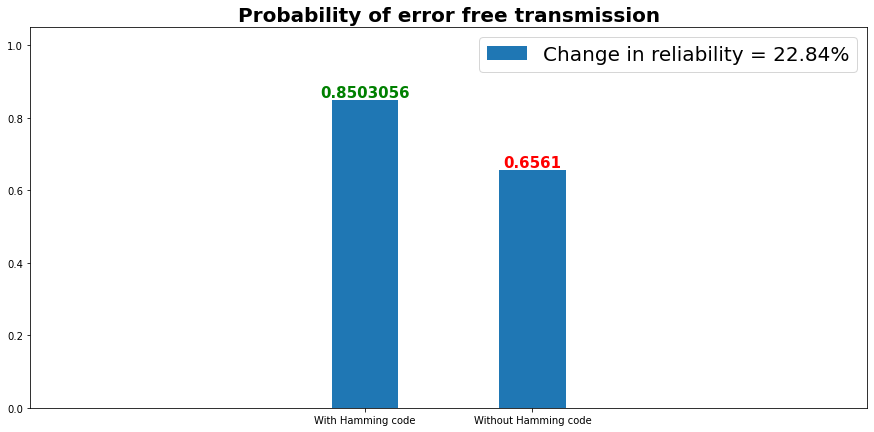

In [22]:
n_HC,n_WHC , p = 7,4,0.1

#No. of bits are allowe for error free Transmission
x_HC = [0,1]
x_WHC = [0]

#Probability calculation for error free transmission
w_HC = sum(binom.pmf(x_HC , n_HC , p))
wo_HC = sum(binom.pmf(x_WHC , n_WHC,p))

CH_r = (w_HC - wo_HC)*100/w_HC
#Visualizing the probabilities
plt.figure(figsize = (15,7))
plt.xlim(-2,3)
plt.bar(['With Hamming code' , 'Without Hamming code'],[w_HC , wo_HC],width = 0.4 ,label = f'Change in reliability = {round(CH_r,3)}%')
plt.text(0 , w_HC , round(w_HC,9),size = 15 , weight = 'bold' , ha = 'center' , va = 'bottom' , c = 'g')
plt.ylim(0,1.05)
plt.text(1 , wo_HC , wo_HC,size = 15 , weight = 'bold' , ha = 'center' , va = 'bottom' , c = 'r')
plt.title('Probability of error free transmission', weight = 'extra bold' , size = 20)
plt.legend(prop = {'size':20})
plt.show()


## 2)

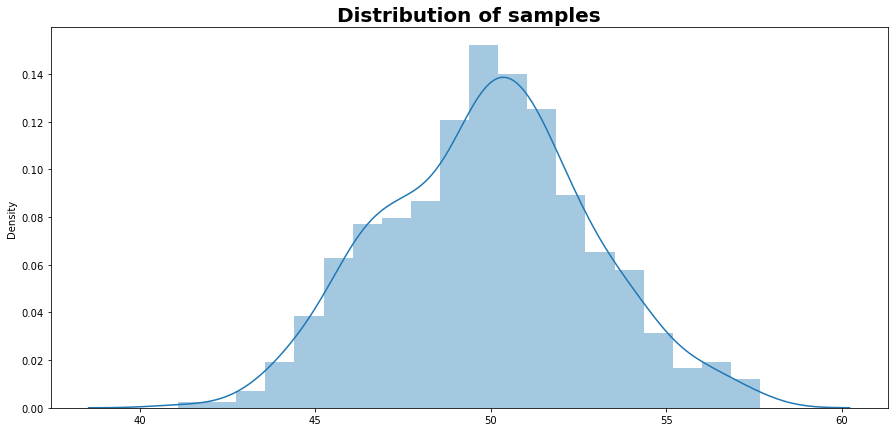

In [3]:
unf = []

#Drawing samples and adding them
M = 500
for i in range(M):
    unf.append(sum(np.random.uniform(0,1,100)))

plt.figure(figsize = (15,7))
sns.distplot(unf , bins = 20)
plt.title('Distribution of samples' , size= 20,weight = 'extra bold')
plt.show()

- __The above shows the result of Central limit theorem.The sum of 'm'(100) No. of independent $U(0,1)$ gives ```Normal distribution``` with mean, $\mu$ = 50 and variance, $\sigma^2$ = $\frac{100}{12}$__


## 3)

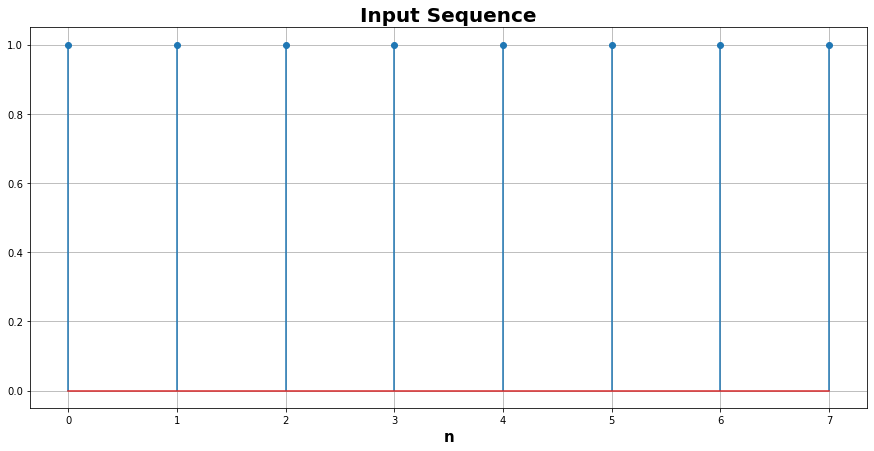

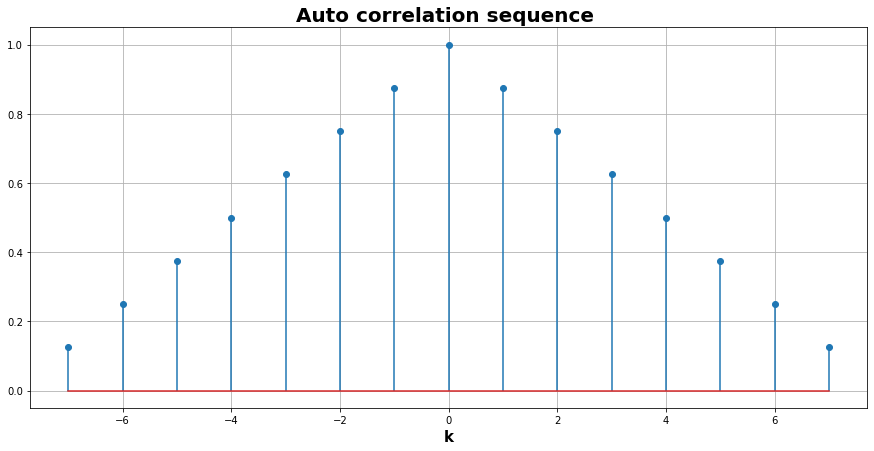

In [4]:
'''Correlation function'''
def correlate(x , N):
    
    r = [sum(x * x)/len(x)]

    for i in range(1,N):
        r.append(sum(x[i:] * x[:-1*i])/len(x))
        
    r = r[1:][::-1] + r 
    return r


#input sequence
x = np.ones(8)

plt.figure(figsize = (15,7))
plt.stem(np.arange(len(x)) , x)
plt.xlabel('n' , size = 15 , weight = 'bold')
plt.title(r'Input Sequence', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

#calcuating r(k)
r = correlate(x , len(x))


plt.figure(figsize = (15,7))
plt.stem(np.arange(-1*len(x)+1 , len(x)) , r)
plt.xlabel('k' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence ', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

## 4a)

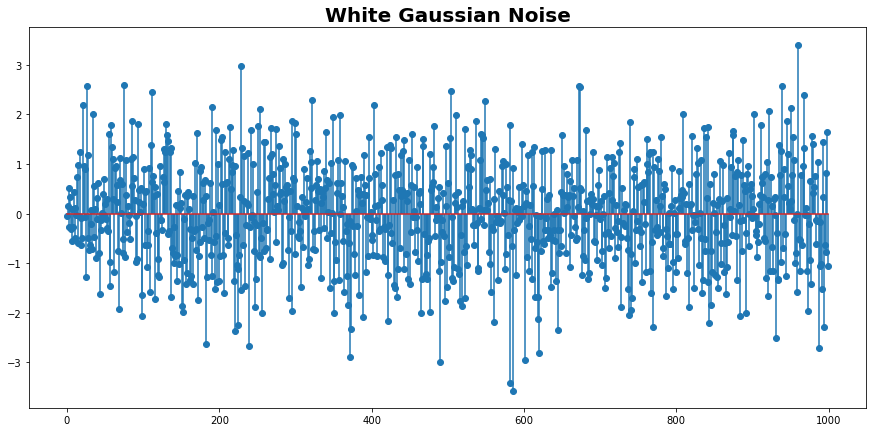

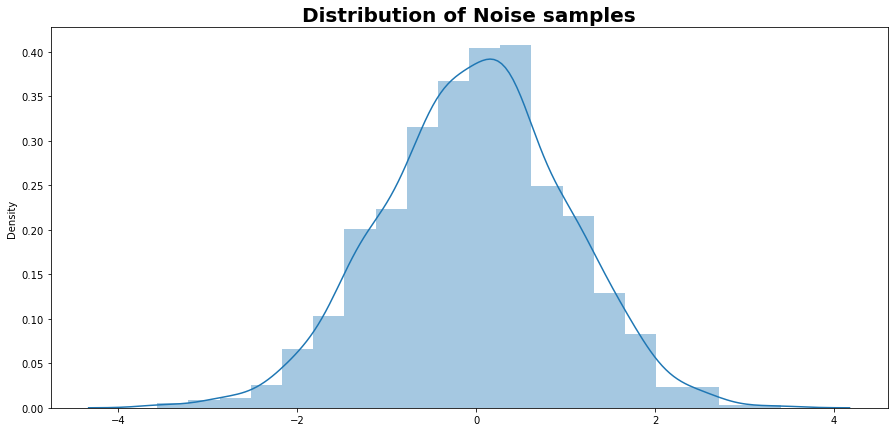

In [5]:
#White Gaussian Noise
x = np.random.normal(0,1,1000)

plt.figure(figsize = (15,7))
plt.stem(np.arange(len(x)) , x)
plt.title('White Gaussian Noise' , size= 20,weight = 'extra bold')
plt.show()

plt.figure(figsize = (15,7))
sns.distplot(x , bins = 20)
plt.title('Distribution of Noise samples' , size= 20,weight = 'extra bold')
plt.show()

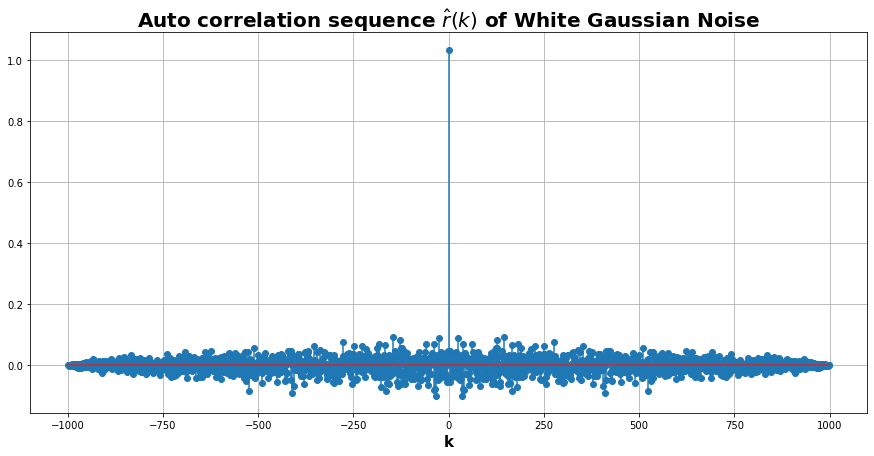

In [6]:
#Calculation Correlation
r = correlate(x,len(x)) 

plt.figure(figsize = (15,7))
plt.stem(np.arange(-999 , 1000) , r)
plt.xlabel('k' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence $\hat{r}(k)$ of White Gaussian Noise', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

## 4b)

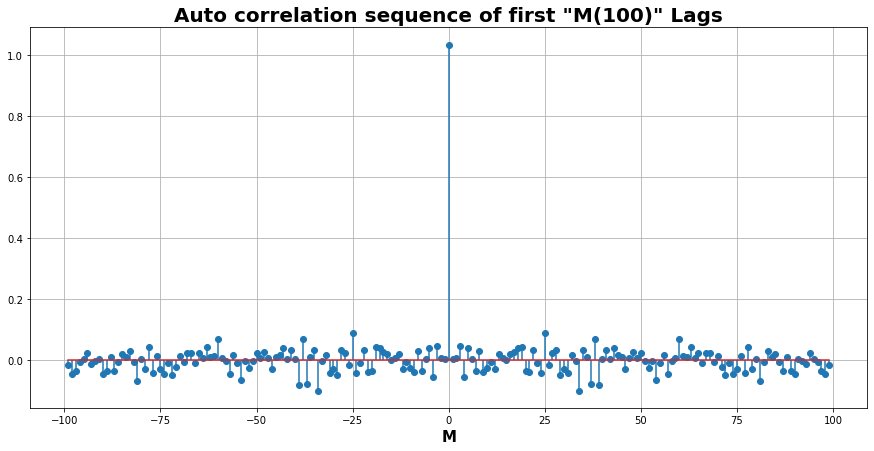

In [7]:
r = correlate(x , 100)


plt.figure(figsize = (15,7))
plt.stem(np.arange(-99,100) , r)
plt.xlabel('M' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence of first "M(100)" Lags', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

- __We know that the  Auto correlation sequence of a white noise will be in the form of $\sigma^2\delta[n]$,The same can be observed form the plot.__

## 4c)

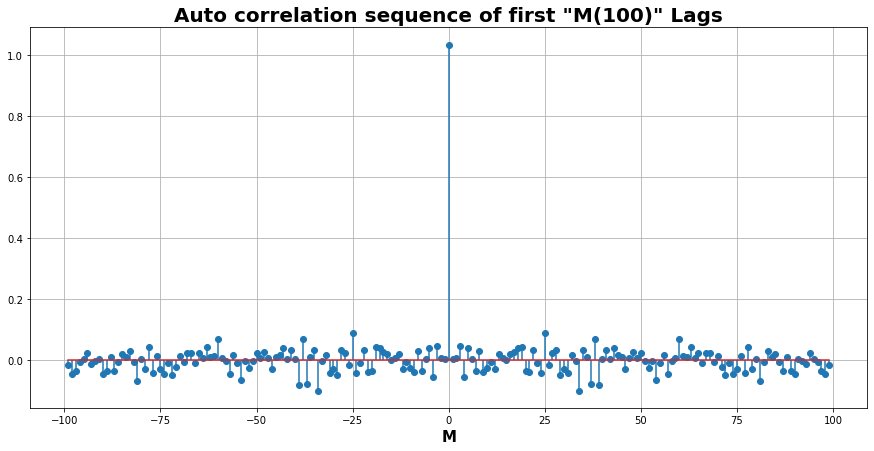

In [8]:
M = 100
r_hat = [0]*100

for k in range(M):
    
    res = 0
    for m in range(10):
        
        for n in range(M):
            
            if n+100*m in range(1000) and (n-k)+100*m in range(1000):
                res += x[n+100*m] * x[(n-k)+100*m]
    r_hat[k] = res/1000

r_hat = r_hat[1:][::-1] + r_hat           
plt.figure(figsize = (15,7))
plt.stem(np.arange(-99,100) , r_hat)
plt.xlabel('M' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence of first "M(100)" Lags', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

- __The result is same as that of we obtained in the part(b) and is close to $\delta[n]$.__

## 4d)

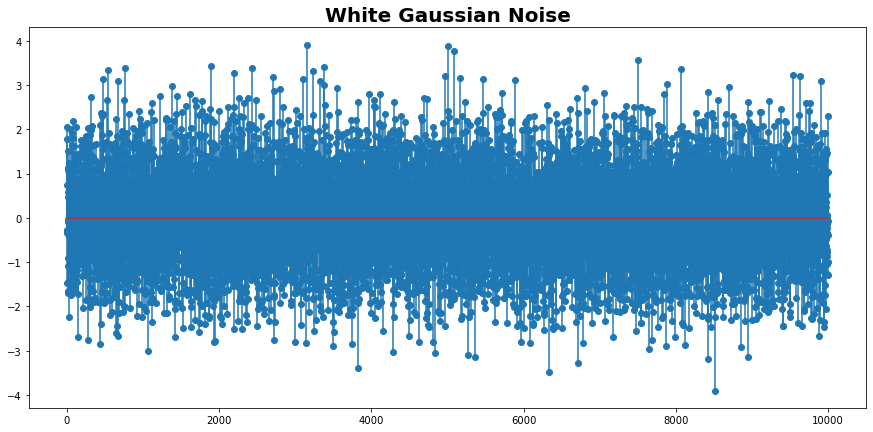

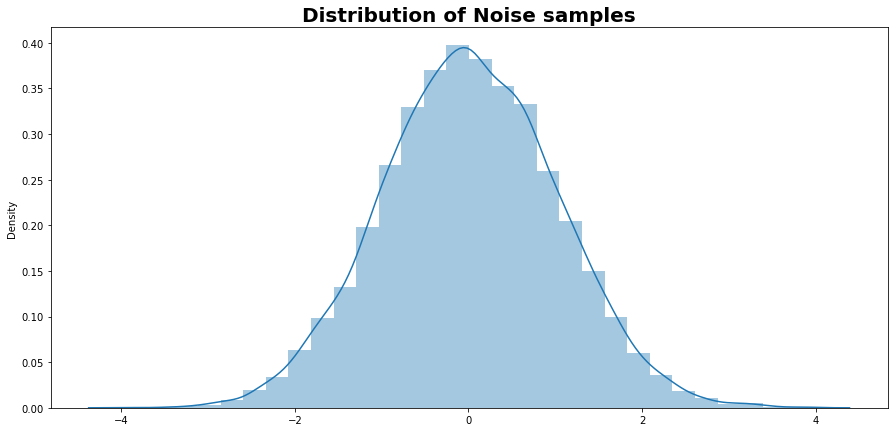

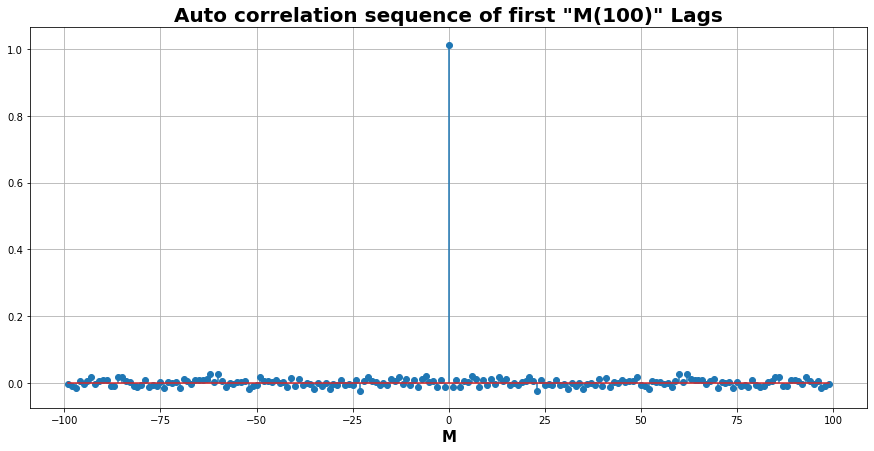

In [9]:
spls = np.random.normal(0,1,10000)

plt.figure(figsize = (15,7))
plt.stem(np.arange(len(spls)) , spls)
plt.title('White Gaussian Noise' , size= 20,weight = 'extra bold')
plt.show()



plt.figure(figsize = (15,7))
sns.distplot(spls , bins = 30 )
plt.title('Distribution of Noise samples' , size= 20,weight = 'extra bold')
plt.show()



r2 = correlate(spls ,  100)

plt.figure(figsize = (15,7))
plt.stem(np.arange(-99,100) , r2)
plt.xlabel('M' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence of first "M(100)" Lags', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

- __This shows the same results . As the number of samples are sufficinetly large the auto correlations sequence gets more close to $\delta[n]$__

## 5)

In [10]:
#reading csv file
df = pd.read_csv('seeds.csv')

df=df.drop('Type',axis = 1)
df.head()


,Area,Perimeter,Compactness,Kernel.Length,Kernel.Width,Asymmetry.Coeff,Kernel.Groove
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175


In [11]:
'''Correlation Function'''
def corr(f1,f2):
    
    f1  = f1 - f1.mean()
    f2 = f2 - f2.mean()
    
    r = (f1 * f2).sum() / (np.sqrt(sum(f1**2)) * np.sqrt(sum(f2**2)))
    return round(r,5)

'''Covariance Function'''
def cov(f1,f2):
    
    f1  = f1 - f1.mean()
    f2 = f2 - f2.mean()
    
    v = (f1 * f2).sum() / (len(f1)-1)
    return round(v,5)



corr_mtx = np.zeros((7,7))
cov_mtx = np.zeros((7,7))

for i in range(df.shape[1]):
    for j in range(i,df.shape[1]):
        
        f1 = df.iloc[:,i]
        f2 = df.iloc[:,j]
        
        cov_mtx[i][j] = cov(f1,f2)
        cov_mtx[j][i] = cov(f1,f2)
        
        corr_mtx[i][j] = corr(f1, f2)
        corr_mtx[j][i] = corr(f1, f2)
        
        

cov_in = df.cov().apply(lambda x:round(x,5))
corr_in = df.corr().apply(lambda x:round(x,5))

print('Correlation Matrix:')
display(pd.DataFrame(corr_mtx))


print('\n\nCovariance Matrix:')
display(pd.DataFrame(cov_mtx))


#check with in built functions
print('\n\nCheck for Covariance function\n')
print((cov_mtx == cov_in).all().all())

print('\n\n')
print('Check for Correlation function\n')
print((corr_mtx == corr_in).all().all())

Correlation Matrix:


,0,1,2,3,4,5,6
0,1.00000,0.99444,0.60989,0.95113,0.97098,-0.22282,0.86273
1,0.99444,1.00000,0.53184,0.97294,0.94550,-0.21103,0.88954
2,0.60989,0.53184,1.00000,0.37401,0.76217,-0.32940,0.22702
3,0.95113,0.97294,0.37401,1.00000,0.86268,-0.16970,0.93212
4,0.97098,0.94550,0.76217,0.86268,1.00000,-0.25312,0.74823
5,-0.22282,-0.21103,-0.32940,-0.16970,-0.25312,1.00000,-0.00335
6,0.86273,0.88954,0.22702,0.93212,0.74823,-0.00335,1.00000




Covariance Matrix:


,0,1,2,3,4,5,6
0,8.52626,3.80518,0.04153,1.23198,1.07263,-0.95714,1.24123
1,3.80518,1.71726,0.01625,0.56558,0.46875,-0.40683,0.57436
2,0.04153,0.01625,0.00054,0.00387,0.00672,-0.01130,0.00261
3,1.23198,0.56558,0.00387,0.19678,0.14478,-0.11074,0.20373
4,1.07263,0.46875,0.00672,0.14478,0.14313,-0.14088,0.13947
5,-0.95714,-0.40683,-0.01130,-0.11074,-0.14088,2.16414,-0.00243
6,1.24123,0.57436,0.00261,0.20373,0.13947,-0.00243,0.24277




Check for Covariance function

True



Check for Correlation function

True


## 6a)

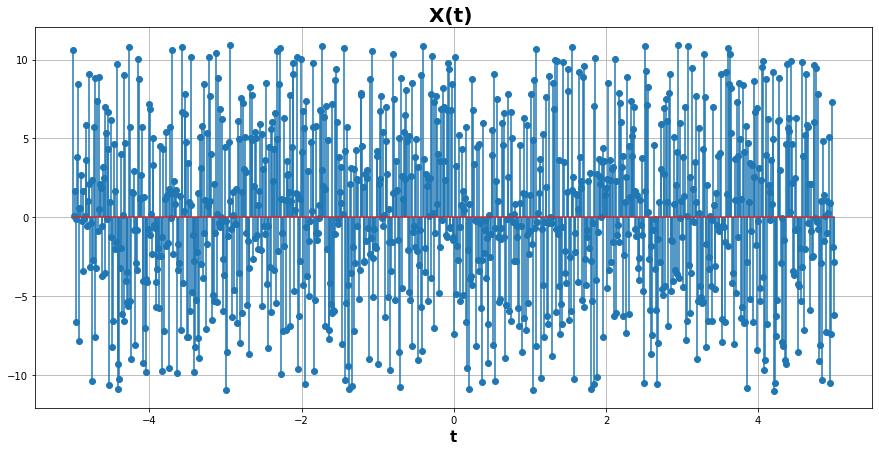

In [12]:

x = np.linspace(-5,5,1000)

f = 5*np.sin(2*x + np.random.uniform(-np.pi , np.pi,len(x))) + 6*np.cos(3*x + np.random.uniform(0 , 2*np.pi ,len(x)))


plt.figure(figsize = (15,7))
plt.stem(x , f ,)
plt.xlabel('t' , size = 15 , weight = 'bold')
plt.title(r'X(t) ', size= 20,weight = 'extra bold')
plt.grid()
plt.show()





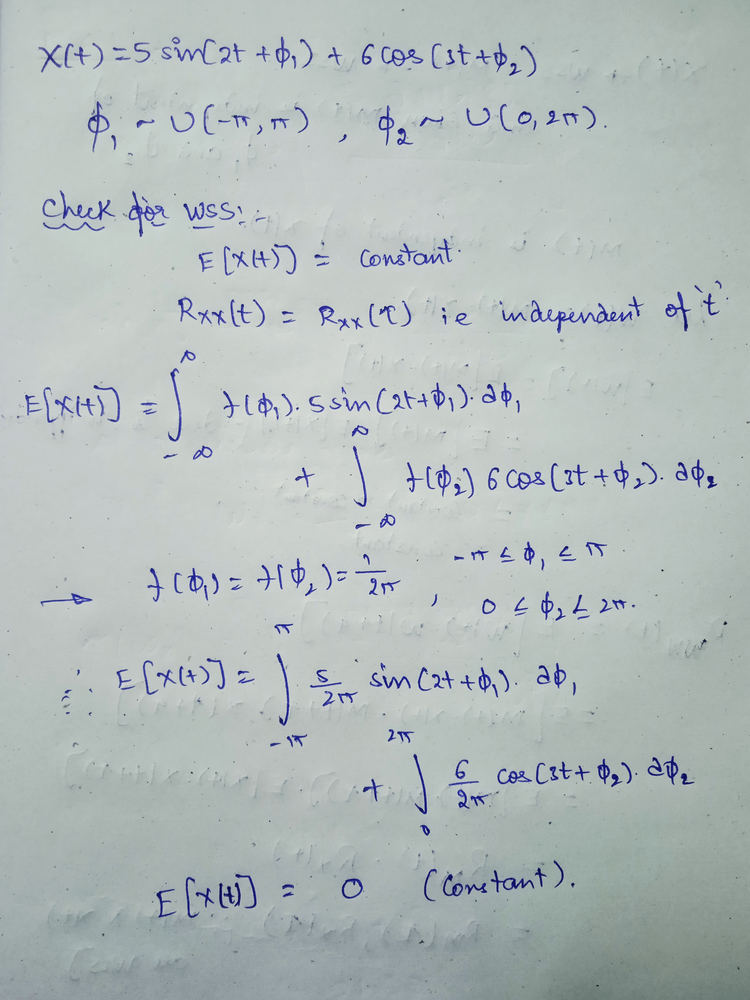

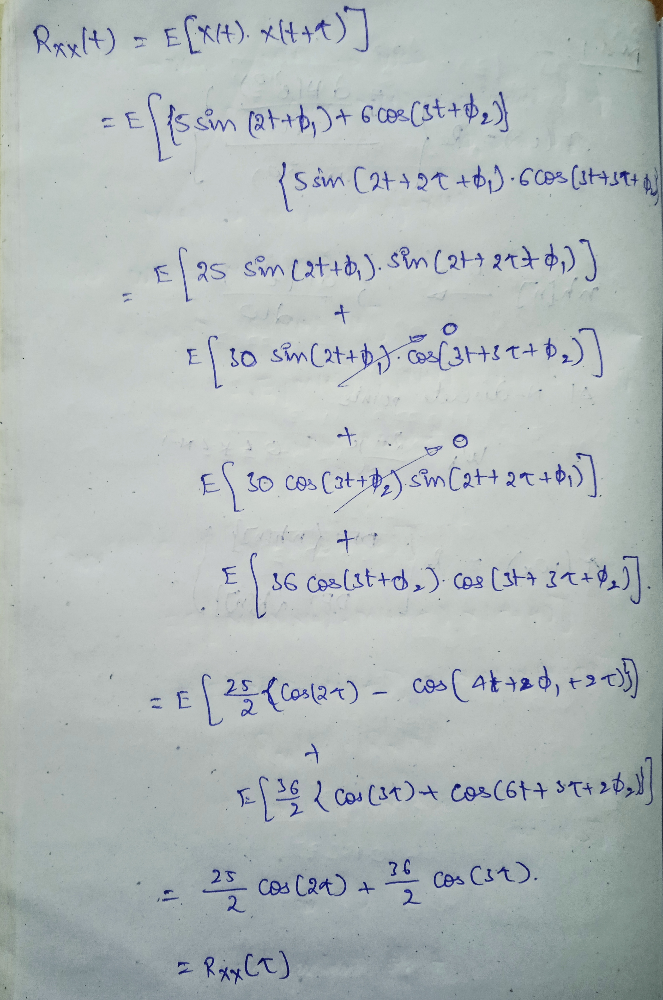

> X(t) is WSS process

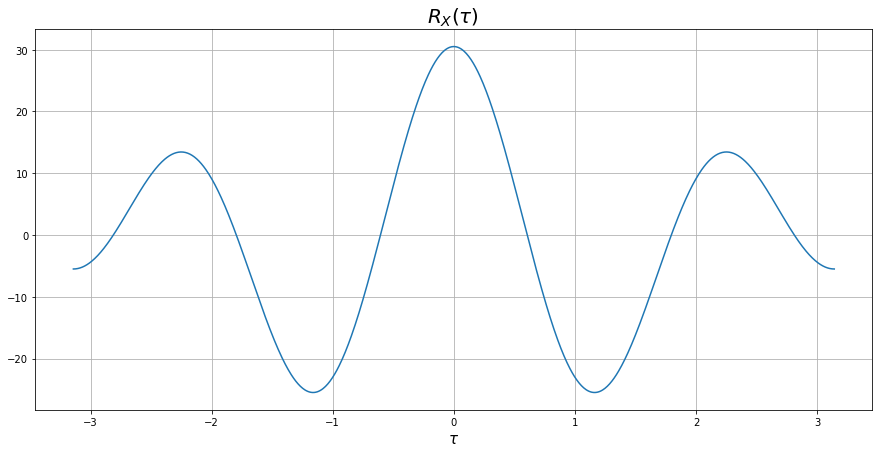

In [13]:
#plotting the AutoCorrelation
m6 = np.linspace(-1*np.pi , 1*np.pi,1000)

Rx = 0.5*(25 * np.cos(2*m6) + 36*np.cos(3*m6))
plt.figure(figsize=(15,7))
plt.plot(m6,Rx)
plt.xlabel(r'$\tau$',size= 15,weight = 'bold')
plt.title(r'$R_X(\tau)$ ', size= 20,weight = 'extra bold')
plt.grid()
plt.show()

## 6b)

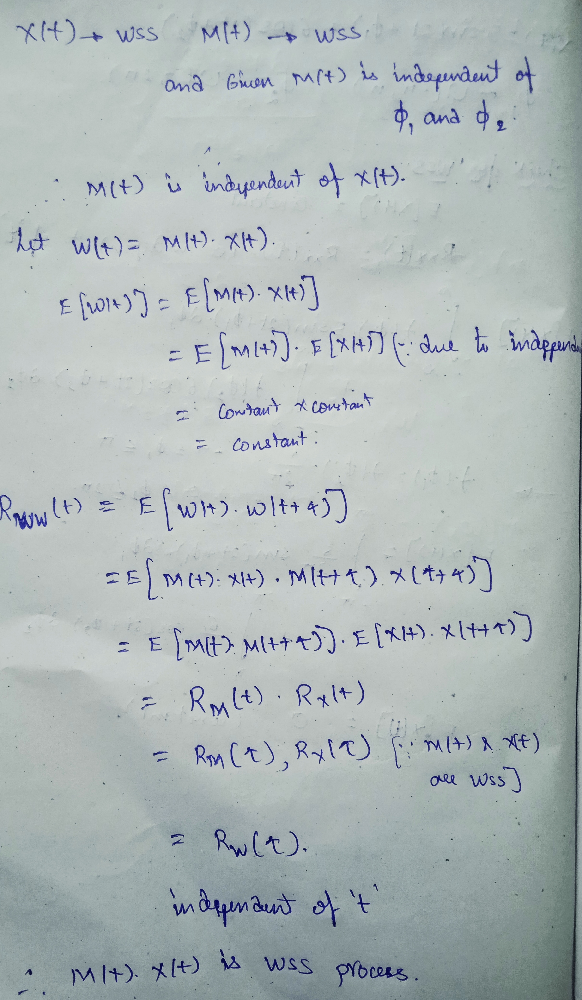

## 7a)

In [14]:
chi_spls = np.random.chisquare(df = 2 , size = (2,3))

print('Samples of size 2 x 3 drawn out of ChiSquare distribution with DF =  2 : ')
display(pd.DataFrame(chi_spls))

Samples of size 2 x 3 drawn out of ChiSquare distribution with DF =  2 : 


,0,1,2
0,0.918310,0.869519,6.871215
1,1.365084,0.764045,0.610260


## 7b)

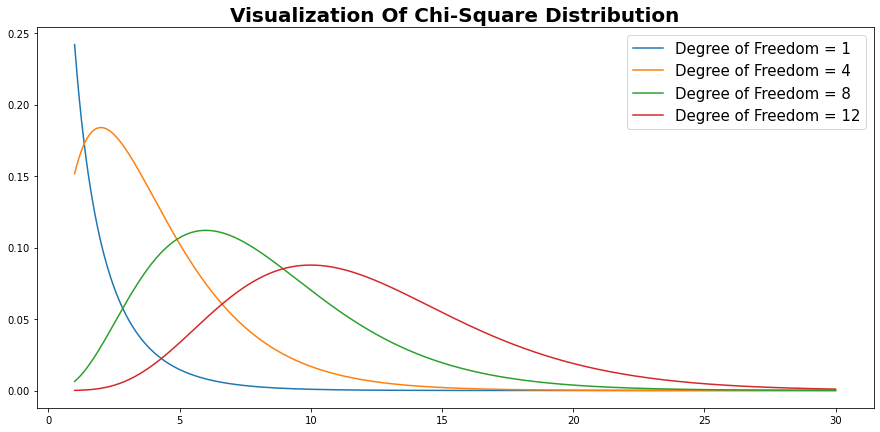

In [15]:
DF = [1,4,8,12]
x = np.linspace(1,30,1000)

plt.figure(figsize = (15,7))
for df in DF:
    sns.lineplot(x,chi2.pdf(x , df = df) , label = f'Degree of Freedom = {df}')
plt.legend(prop = {'size':15})
plt.title(r'Visualization Of Chi-Square Distribution', size= 20,weight = 'extra bold')
plt.show()

## 8a)

In [16]:
exp_spls = np.random.exponential(scale = 2 , size = (2,3))

print('Samples of size 2 x 3 drawn out of exponential distribution with scale =  2 : ')
display(pd.DataFrame(exp_spls))



Samples of size 2 x 3 drawn out of exponential distribution with scale =  2 : 


,0,1,2
0,7.556762,0.786917,0.633754
1,0.893029,1.733011,5.378139


## 8b)

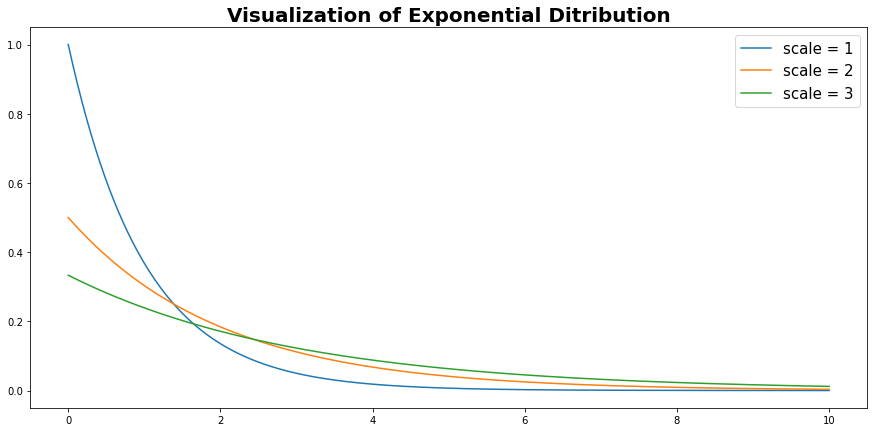

In [17]:
S= [1,2,3]
x = np.linspace(0,10,1000)

plt.figure(figsize = (15,7))
for s in S:
    sns.lineplot(x,expon.pdf(x , scale = s) , label = f'scale = {s}')
plt.legend(prop = {'size':15})
plt.title(r'Visualization of Exponential Ditribution', size= 20,weight = 'extra bold')
plt.show()

## 9a)

In [18]:
arr_100 = np.random.choice([2,4,6,8] , p = [0.1,0.3,0.6,0] , size = 100)
print('Array with size 100:')
print('\t\t',arr_100)

Array with size 100:
		 [4 2 6 6 2 6 6 6 6 6 4 6 6 6 4 4 4 6 6 6 6 6 6 6 6 4 2 6 6 6 6 6 4 6 2 4 4
 6 6 4 6 4 6 2 2 6 4 6 6 6 6 4 4 4 6 4 4 6 4 6 6 6 4 4 4 6 6 6 6 4 6 6 6 4
 6 4 6 4 6 6 4 6 4 6 6 4 6 2 4 4 6 6 2 2 4 6 4 6 6 6]


## 9b)

In [19]:
s_3x5 = np.random.choice([2,4,6,8] , p = [0.1,0.3,0.6,0] , size = (3,5))
print('2-D array with size 3x5:')
print(s_3x5)

2-D array with size 3x5:
[[6 6 4 4 4]
 [2 6 6 2 6]
 [6 6 4 6 4]]


## 10a)

## PDF of central Chi-square distribution:
### $$ f(x) = \frac{1}{2^{k/2} \Gamma(k/2)} x^{k/2-1} e^{-x/2}$$
### $$ Where,\Gamma(k/2)\ denotes\ gamma\ function$$

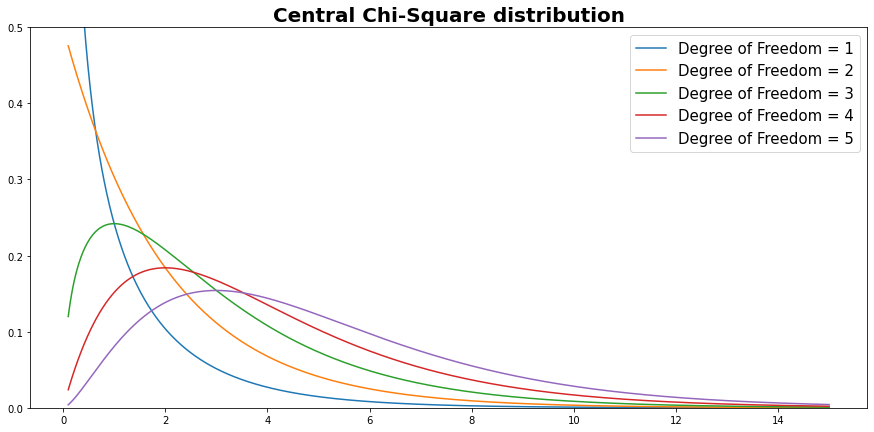

In [20]:
def central_chi2(x , k):
    
    num = np.power(x,k/2 - 1) * np.exp(-0.5*x)
    den = np.math.gamma(k/2) * (2**(k/2))
    
    return num/den

 
x = np.linspace(0.1,15,1000)

K = [1,2,3,4,5]

plt.figure(figsize = (15,7))

for k in K:
    sns.lineplot(x,central_chi2(x , k) , label = f'Degree of Freedom = {k}')
plt.ylim(0,0.5)
plt.legend(prop = {'size':15})
plt.title(r'Central Chi-Square distribution', size= 20,weight = 'extra bold')
plt.show()
    

## 10b)

## PDF of non-central Chi-square distribution:
### $$f(x) = \frac{1}{2}e^{-(x+\lambda)/2}\Big(\frac{x}{\lambda}\Big)^{k/4 - 1/2}I_{k/2-1}(\sqrt{\lambda x})$$
### $$Where,I_v(y)\ denotes\ the\ modified\ Bessel\ function\ of \ first\ kind$$

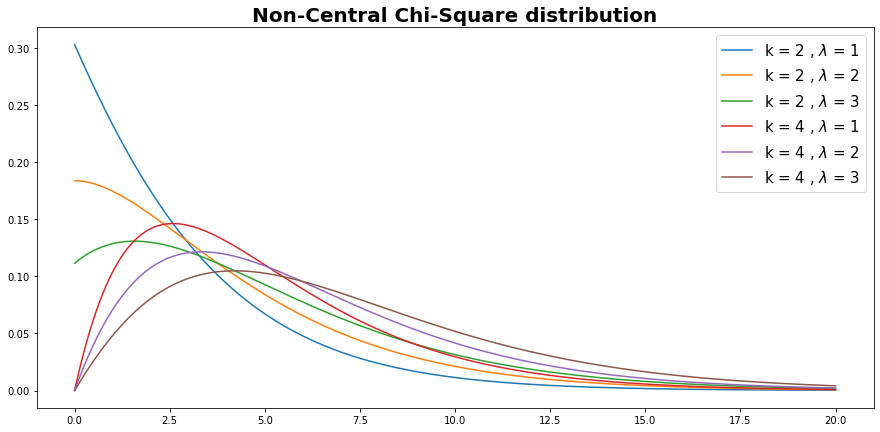

In [21]:

def noncentral_chi2(x,k,lmda):
    
    res = 0.5 * np.exp(-0.5 * (x + lmda)) * np.power(x/lmda , (k/4 - 0.5)) * iv( 0.5*k-1 , np.sqrt(lmda*x) )
    return res
    
x = np.linspace(0,20,1000)

K = [2,4]
LM = [1,2,3]


plt.figure(figsize = (15,7))

for k in K:
    for lm in LM:
        sns.lineplot(x,noncentral_chi2(x , k , lm) , label = f'k = {k} , $\lambda$ = {lm}')

plt.legend(prop = {'size':15})

plt.title(r'Non-Central Chi-Square distribution', size= 20,weight = 'extra bold')
plt.show()